<a href="https://colab.research.google.com/github/neel-p8/Applying-tSNE-using-a-CNN-with-cifar10/blob/main/Neel_Patel_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Learning to Transfer Learn

# Overview
Apply tSNE to the feature vectors output by a Convolutional Neural Network (CNN)



In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Task 0

Load the cifar10 data

In [ ]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

170498071/170498071 [==============================] - 10s 0us/step


# Task 1

Build a CNN which accepts cifar10 images as input


In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(10, activation='softmax'))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

16705208/16705208 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional  (None, 1, 1, 1280)        4049571   
 )                                                               
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 10)                12810     
                                                                 
Total params: 4062381 (15.50 MB)
Trainable params: 4020358 (15.34 MB)
Non-trainable params: 42023 (164.16 KB)
_________________________________________________________________


# Task 2

Feed entire test data through the feature extraction part of the network

In [ ]:
feature_vectors = base_model.predict(x_test)

313/313 [==============================] - 19s 54ms/step


# Task 3

Apply tSNE to the resulting vectors

In [ ]:
from sklearn.manifold import TSNE
flatten_feature_vectors = feature_vectors.reshape(feature_vectors.shape[0], -1)
tsne = TSNE(n_components=2, random_state=0)
tsne_results = tsne.fit_transform(flatten_feature_vectors)

# Task 4

Visualize tSNE output using a 2-dimensional scatterplot, color pointing depending on the correct label

In [ ]:
labels = np.array('airplanes,cars,birds,cats,deer,dogs,frogs,horses,ships,trucks'.split(','))

<ipython-input-8-b541f0b18c00>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10', 10)


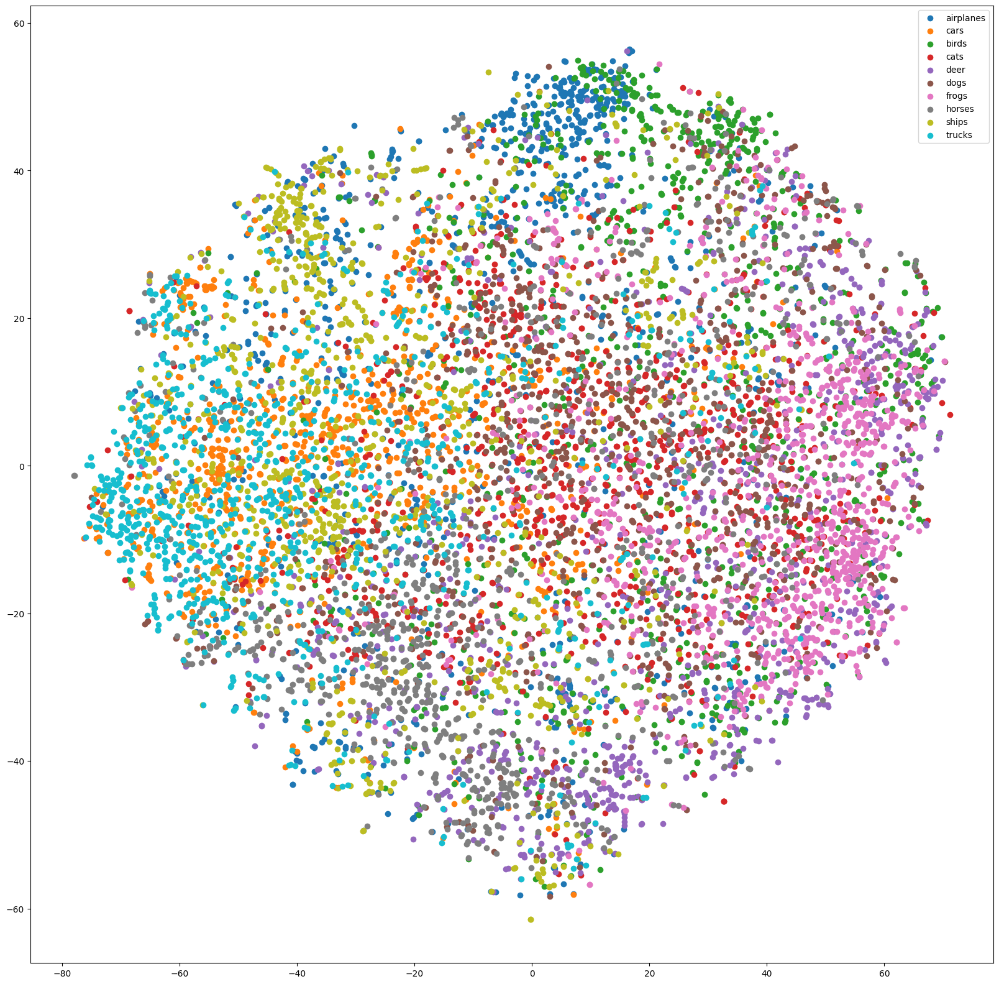

In [ ]:
cmap = plt.cm.get_cmap('tab10', 10)
plt.figure(figsize = (20,20))

for lab, col in enumerate(labels):
    points = tsne_results[y_test.flatten()==lab]
    plt.scatter(points[:, 0], points[:, 1], color=cmap(lab), label=col)
plt.legend()
plt.show()

# Task 5

Visualize tSNE output using a scatterplot, but this time showing image corresponding to each point

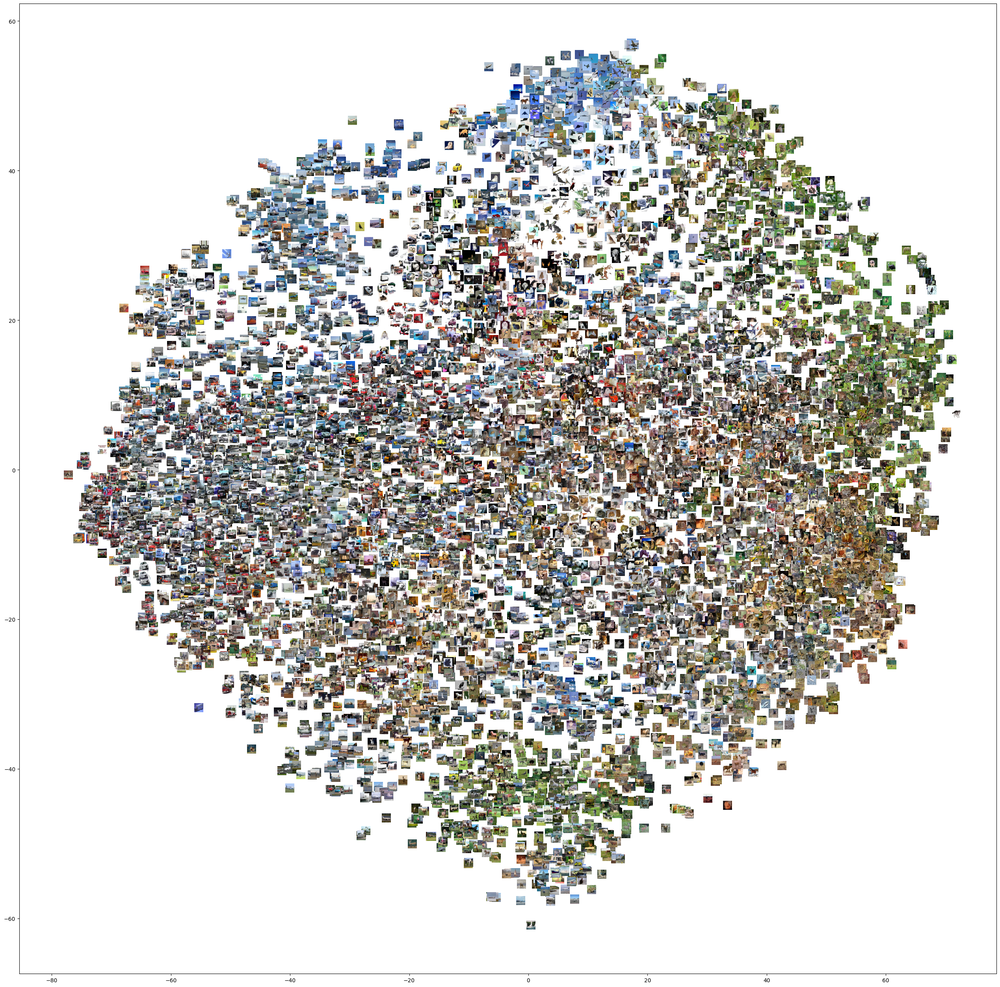

In [ ]:
import matplotlib.offsetbox as offsetbox

def scatterplot_image(X_2d, images, image_size=0.5):
  fig, ax = plt.subplots(figsize=(32,32))
  art = []
  for xy, i in zip(X_2d, images):
    x0, y0 = xy
    img = offsetbox.OffsetImage(i, zoom=image_size)
    ab = offsetbox.AnnotationBbox(img, (x0, y0), box_alignment=(0,0), frameon=False)
    art.append(ax.add_artist(ab))
  ax.update_datalim(X_2d)
  ax.autoscale()
  plt.show()

scatterplot_image(tsne_results, x_test)

# Bonus

Use a network trained for classification on cifar10. Repeat the tSNE plots using the fine tuned CNN. Then use output of entire classifier



Epoch 1/5
1563/1563 [==============================] - 521s 318ms/step - loss: 1.4939 - accuracy: 0.4863 - val_loss: 1.0073 - val_accuracy: 0.6469
Epoch 2/5
1563/1563 [==============================] - 490s 314ms/step - loss: 0.9447 - accuracy: 0.6729 - val_loss: 0.7763 - val_accuracy: 0.7334
Epoch 3/5
1563/1563 [==============================] - 487s 311ms/step - loss: 0.7660 - accuracy: 0.7344 - val_loss: 0.6817 - val_accuracy: 0.7679
Epoch 4/5
1563/1563 [==============================] - 489s 313ms/step - loss: 0.6494 - accuracy: 0.7731 - val_loss: 0.6279 - val_accuracy: 0.7836
Epoch 5/5
313/313 [==============================] - 17s 55ms/step


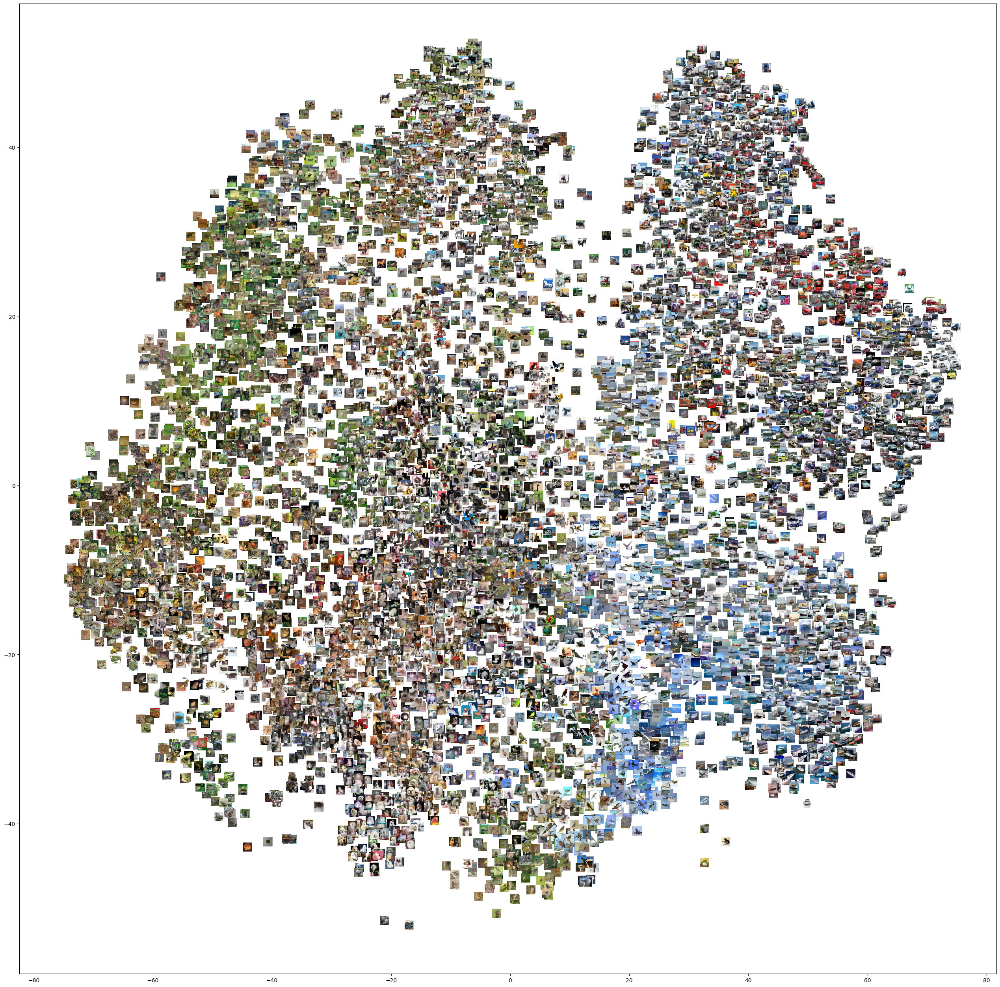

In [ ]:
# dont recommend running again, takes ~45 minutes. probably can optimize, but
# idk

from tensorflow.keras.optimizers import Adam
for layer in base_model.layers[-20:]:
    layer.trainable = True

model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(10, activation='softmax'))
model.compile(optimizer=Adam(1e-4), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(x_train, y_train, epochs=5, validation_data=(x_test, y_test))
feature_vectors_2 = base_model.predict(x_test)

tsne_2 = TSNE(n_components=2, random_state=0)
tsne_results_2 = tsne_2.fit_transform(feature_vectors_2.reshape(feature_vectors_2.shape[0], -1))

scatterplot_image(tsne_results_2, x_test)